## MuSpAn: Figure 3. Quantification of cell-cell proximity

To run this script, please download the accomanpying MuSpAn domains and metadata from the [accompanying Zenodo repository](https://doi.org/10.5281/zenodo.17176282). Once downloaded, extract the zip files locally.

The relevent downloads for this script are:
 - domains_for_figs_2_to_6/fig-3-domain.muspan
 - misc_checkpoint_data/cell_id_to_type_dict_healthy.pkl

 Please make sure you edit the path variable to your extracted folder location: ``path_to_local_zenodo_download_file``

---

In this notebook we will reproduce analysis that is used to generate Figure 3 from MuSpAn: A Toolbox for Multiscale Spatial Analysis. This figure focues on proximity analysis at the cellular scale using a spatial transcriptomics sample of healthy mouse colon. See reference paper for details.

We'll start by importing muspan with some additional imports for making plots look nice.

In [77]:
# imports for analysis
import muspan as ms 
import numpy as np

# imports to make plots pretty
import seaborn as sns
sns.set_theme(style='white',font_scale=2)
sns.set_style('ticks')
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.font_manager as fm
import pickle   
mpl.rcParams['figure.dpi'] = 150 # set the resolution of the figure
np.random.seed(42) # Fixed seed for reproducibility

## EDIT THE LINE FOLLOWING LINE ##
path_to_local_zenodo_download_file = 'some_path_to_your_local_copy_of_zenodo_download' 

For reproducibility we use the io save-load functionality of muspan to load a premade domain of the sample.

In [78]:
# path to the domain file
domain_path=path_to_local_zenodo_download_file + '/domains_for_figs_2_to_6/fig-3-domain.muspan'

# load the domain
domain_2 = ms.io.load_domain(path_to_domain=domain_path,print_metadata=True)

MuSpAn domain loaded successfully. Domain summary:
Domain name: Mouse_colon_selection_fig_3
Number of objects: 3283
Collections: ['Cell boundaries']
Labels: ['Cell ID', 'Transcript Counts', 'Cell Area', 'Cluster ID', 'Nucleus Area'] 
Networks: [] 
Distance matrices: []
version saved with: 1.0.0
Data and time of save: 2024-11-12 10:02:10.501746
Notes: A selected ROI from a sample of healthy colon tissue from a 10x Xenium dataset provided in the public resources repository. The domain contains cell boundaries, nuclei and a selection of transcripts: Mylk, Myl9, Cnn1, Mgll, Mustn1, Oit1, Cldn2, Nupr1, Sox9, Ccl9. The dataset also contains cell clustering labels produced by Xenium Onboard Analysis using the ‘Graph-based’ method. This dataset is licensed under the Creative Commons Attribution license.


Next we'll run some color matching the domain for consistency across the figures and define the transcripts of interest

In [79]:
# Color matching the domain for consistency across the figures

# Define the order of cluster IDs
cluster_id_order = [
    'Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4', 'Cluster 5', 
    'Cluster 6', 'Cluster 7', 'Cluster 8', 'Cluster 9', 'Cluster 10',
    'Cluster 11', 'Cluster 12', 'Cluster 13', 'Cluster 14', 'Cluster 15', 
    'Cluster 16', 'Cluster 17', 'Cluster 18', 'Cluster 19', 'Cluster 20',
    'Cluster 21', 'Cluster 22', 'Cluster 23', 'Cluster 24', 'Cluster 25', 
    'Unassigned'
]

# Initialize an empty list to store colors
cell_colors = []

# Load the cell ID to type mapping from the pickle file
type_path = path_to_local_zenodo_download_file + '/misc_checkpoint_data/cell_id_to_type_dict_healthy.pkl'
with open(type_path, 'rb') as f:
    cell_id_to_type_dict = pickle.load(f)

# Assign colors to each cluster ID
for i in range(len(cluster_id_order)):
    if i < 10:
        cell_colors.append(sns.color_palette('tab20')[(2 * i) % 20])
    else:
        cell_colors.append(sns.color_palette('tab20')[(2 * i - 10 + 1) % 20])

# Create a dictionary to map cluster IDs to their corresponding colors
new_colors = {j: cell_colors[cluster_id_order.index(j)] for j in domain_2.labels['Cluster ID']['categories']}

# Update the domain with the new colors
domain_2.update_colors(new_colors, colors_to_update='labels', label_name='Cluster ID')

(<Figure size 2100x2250 with 2 Axes>, <Axes: >)

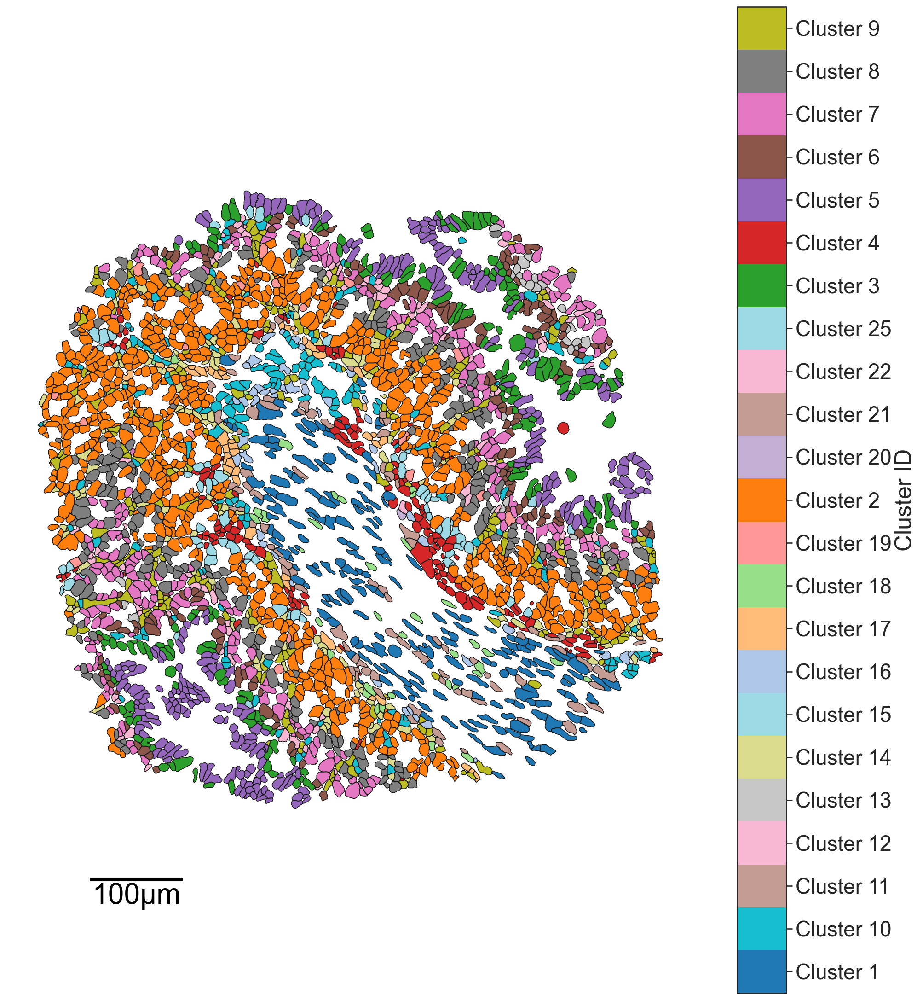

In [70]:
# Query the domain to get cell boundaries
qCells = ms.query.query(domain_2, ('Collection',), 'is', 'Cell boundaries')

# Create a figure and axis for plotting
fig, ax = plt.subplots(figsize=(14, 15))

# Visualize the domain with the specified parameters
ms.visualise.visualise(
    domain_2,
    color_by=('label', 'Cluster ID'),
    objects_to_plot=qCells,
    show_boundary=False,
    marker_size=0.25,
    add_cbar=True,
    ax=ax,
    shape_kwargs=dict(linewidth=0.75, alpha=1),
    add_scalebar=True,
    scalebar_kwargs=dict(
        size=100,
        label='100µm',
        loc='lower left',
        pad=2.8,
        color='black',
        frameon=False,
        size_vertical=3,
        fontproperties=fm.FontProperties(size=30)
    )
)


Here we explicity construct a tiling of the domain - this is not the typical way of simply computing a QCM

In [71]:
# Generate quadrats for the domain
ms.region_based.generate_quadrats(domain_2,
                                  side_length=75,
                                  assign_objects_using_labels=True,
                                  region_label_name='ROI',
                                  regions_collection_name='Quadrats',
                                  remove_empty_regions=True,
                                  region_include_method='partial')

(<Figure size 1200x1200 with 1 Axes>, <Axes: >)

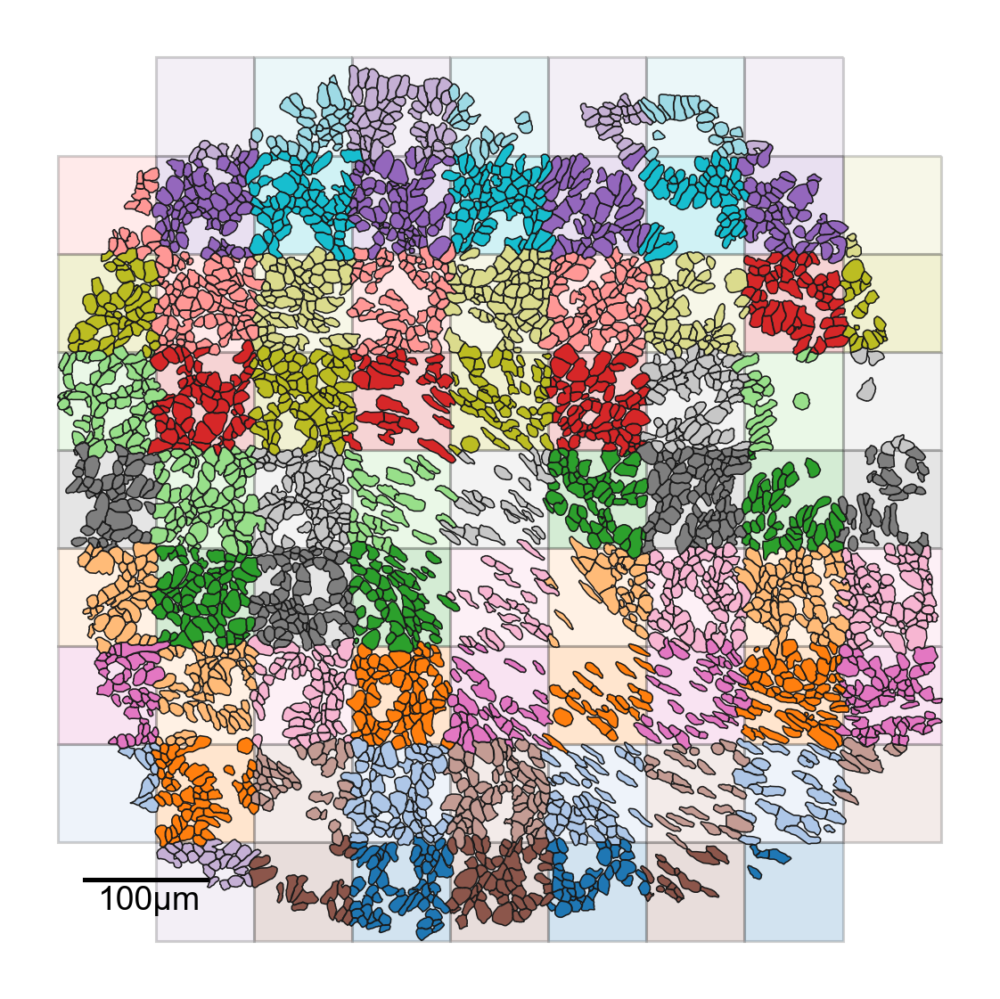

In [72]:
# Create a new figure and axis for plotting
fig, ax = plt.subplots(figsize=(8, 8))

# Query the domain to get quadrats
qQuads = ms.query.query(domain_2, ('Collection',), 'is', 'Quadrats')

# Create a query container and add both cell boundaries and quadrats to it
qCells_and_quads = ms.query.query_container()
qCells_and_quads.add_query(qCells, 'OR', qQuads)

# Visualize the quadrats in the domain
ms.visualise.visualise(
    domain_2,
    color_by=('label', 'ROI'),
    objects_to_plot=qQuads,
    show_boundary=False,
    marker_size=0.25,
    add_cbar=False,
    ax=ax,
    shape_kwargs={'alpha': 0.2, 'linewidth': 1.5}
)

# Visualize the cell boundaries in the domain
ms.visualise.visualise(
    domain_2,
    color_by=('label', 'ROI'),
    objects_to_plot=qCells,
    show_boundary=False,
    marker_size=0.25,
    add_cbar=False,
    ax=ax,
    shape_kwargs={'alpha': 1, 'linewidth': 0.75},
    add_scalebar=True,
    scalebar_kwargs=dict(
        size=100,
        label='100µm',
        loc='lower left',
        pad=2,
        color='black',
        frameon=False,
        size_vertical=2,
        fontproperties=fm.FontProperties(size=18)
    )
)


In [73]:
# Compute the Quadrat Correlation Matrix (QCM)
# This matrix helps in understanding the spatial correlation between different clusters within the defined quadrats (regions of interest).

# SES: Standardized Effect Size
# A: The correlation matrix
# label_categories: The categories of labels used in the analysis

SES, A, label_categories = ms.region_based.quadrat_correlation_matrix(
    domain_2,
    label_name='Cluster ID',
    regions_label_name='ROI',
    alpha=0.05,
    transform_counts=None,
    keep_regions_as_objects=True
)

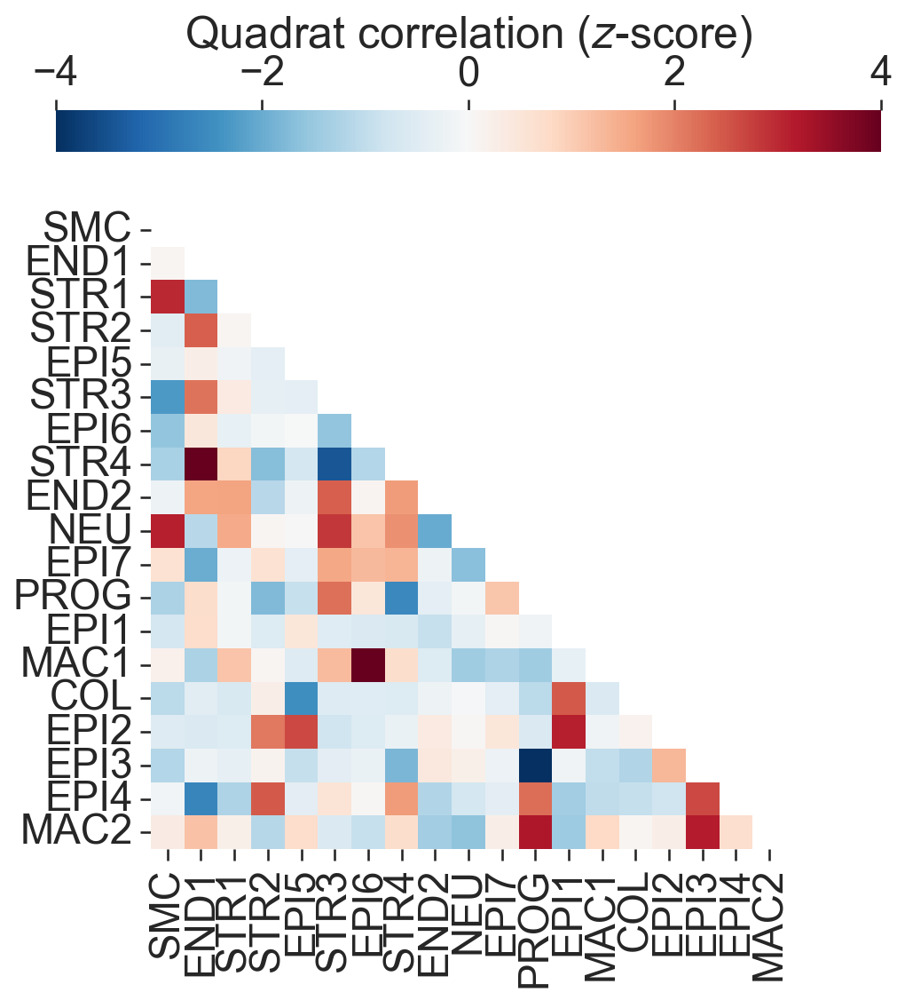

In [76]:
# Convert label categories to numeric label categories for better readability
numeric_label_categories = [cell_id_to_type_dict[lab] for lab in label_categories]

# Create a new figure and axis for the heatmap
fig, ax = plt.subplots(figsize=(8, 8))
fig.set_facecolor('none')
fig.patch.set_alpha(0)

# Mask the upper triangle of the SES matrix to avoid redundant information
SES_mask = np.triu(SES, k=0)

# Sort the SES matrix for better visualization
sorted_indices = np.argsort(SES[:, 0])[::-1]
sorted_SES = SES[sorted_indices][:, sorted_indices]

# Plot the heatmap of the SES matrix
sns.heatmap(SES, xticklabels=numeric_label_categories, yticklabels=numeric_label_categories, ax=ax, cmap='RdBu_r', square=True, linewidths=0, linecolor='black', vmin=-4, vmax=4,
            cbar_kws=dict(use_gridspec=False, location="top", label='Quadrat correlation ($z$-score)', pad=0.075), mask=SES_mask)


In [14]:
# Print the Standardized Effect Size (SES) between specific cell types
# SES helps in understanding the spatial correlation between different clusters

# SES between Celltype 2 and Celltype 5
print('SES: Celltype 2 - 5 = ', SES[numeric_label_categories.index(cell_id_to_type_dict['Cluster 2']), numeric_label_categories.index(cell_id_to_type_dict['Cluster 5'])])

# SES between Celltype 1 and Celltype 11
print('SES: Celltype 1 - 11 = ', SES[numeric_label_categories.index(cell_id_to_type_dict['Cluster 1']), numeric_label_categories.index(cell_id_to_type_dict['Cluster 11'])])


SES: Celltype 2 - 5 =  -1.0531717109232817
SES: Celltype 1 - 11 =  3.0948882960111095


Mean minimum distance 2-5: 106.00905746102633


[Text(0, 0.0, '0'), Text(0, 0.007, '7'), Text(0, 0.014, '14')]

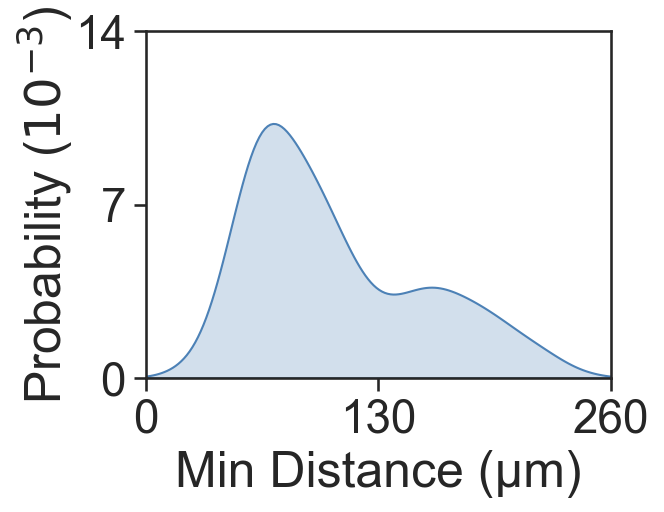

In [15]:
# Define the clusters of interest
ids_ex = ms.query.query(domain_2, ('label', 'Cluster ID'), 'in', ['Cluster 2', 'Cluster 5'])
ids_in = ms.query.query(domain_2, ('label', 'Cluster ID'), 'in', ['Cluster 1', 'Cluster 11'])

# Get object indices for specific clusters
object_indices_2 = ms.query.interpret_query(ms.query.query(domain_2, ('label', 'Cluster ID'), 'is', ['Cluster 2']))
object_indices_5 = ms.query.interpret_query(ms.query.query(domain_2, ('label', 'Cluster ID'), 'is', ['Cluster 5']))

# Calculate the average minimum distance between cells in the same cluster
min_dist_2_5, _, _, _, _ = ms.query.get_minimum_distances_boundaries(domain_2, object_indices_2, object_indices_5)

# Print the mean minimum distance between cells in Cluster 2 and Cluster 5
print('Mean minimum distance 2-5:', np.mean(min_dist_2_5))

# Plot the distribution of minimum distances
fig, ax = plt.subplots(figsize=(4, 3))
sns.kdeplot(x=min_dist_2_5, fill=True, ax=ax, color=[76/255, 129/255, 182/255, 1])
ax.set_xlabel('Min Distance (µm)')
ax.set_ylabel('Probability ($10^{-3}$)', labelpad=0)
ax.set_xlim([0, 260])
ax.set_ylim([0, 0.014])
ax.set_yticks([0, 0.007, 0.014])
ax.set_xticks([0, 130, 260])
ax.set_yticklabels([0, 7, 14])


Mean minimum distance 1-11: 10.942484474507488


[Text(0, 0.0, '0'), Text(0, 0.03, '3'), Text(0, 0.06, '6')]

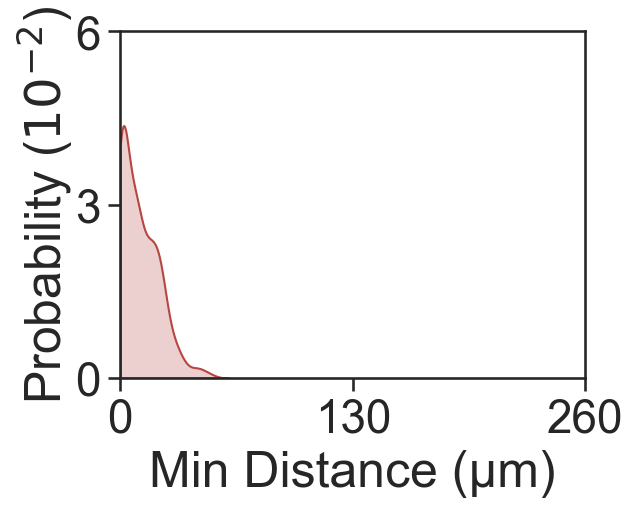

In [16]:
# Query the domain to get object indices for Cluster 1 and Cluster 11
object_indices_1 = ms.query.interpret_query(ms.query.query(domain_2, ('label', 'Cluster ID'), 'is', ['Cluster 1']))
object_indices_11 = ms.query.interpret_query(ms.query.query(domain_2, ('label', 'Cluster ID'), 'is', ['Cluster 11']))

# Calculate the minimum distances between cells in Cluster 1 and Cluster 11
min_dist_1_11, _, _, _, _ = ms.query.get_minimum_distances_boundaries(domain_2, object_indices_1, object_indices_11)

# Print the mean minimum distance between cells in Cluster 1 and Cluster 11
print('Mean minimum distance 1-11:', np.mean(min_dist_1_11))

# Plot the distribution of minimum distances
fig, ax = plt.subplots(figsize=(4, 3))
sns.kdeplot(x=min_dist_1_11, fill=True, ax=ax, color=[181/255, 70/255, 66/255, 1], clip=[0, 250], bw_adjust=1)
ax.set_xlabel('Min Distance (µm)')
ax.set_ylabel('Probability ($10^{-2}$)', labelpad=0)
ax.set_xlim([0, 260])
ax.set_yticks([0, 0.03, 0.06])
ax.set_xticks([0, 130, 260])
ax.set_yticklabels([0, 3, 6])

In [17]:
# Calculate the Average Nearest Neighbour Index (ANNI) between specific clusters
# ANNI helps in understanding the spatial distribution and clustering of different cell types

# Calculate ANNI between Cluster 1 and Cluster 11
ANNI_1_11, zscore_1_11, p_val_1_11 = ms.spatial_statistics.average_nearest_neighbour_index(
    domain_2, population_A=object_indices_1, population_B=object_indices_11
)

# Calculate ANNI between Cluster 2 and Cluster 5
ANNI_2_5, zscore_2_5, p_val_2_5 = ms.spatial_statistics.average_nearest_neighbour_index(
    domain_2, population_A=object_indices_2, population_B=object_indices_5
)

# Print the results
print('ANNI 1 to 11:', ANNI_1_11, zscore_1_11, p_val_1_11)
print('ANNI 2 to 5:', ANNI_2_5, zscore_2_5, p_val_2_5)


ANNI 1 to 11: 0.2934162165625959 -12.894818834298313 4.813930835410534e-38
ANNI 2 to 5: 4.869070708448938 120.94646522310659 0.0


In [18]:
# Calculate the minimum distances between cells in Cluster 2 and Cluster 5
# Also, get the coordinates of the points that minimize these distances
min_dist_2_5, _, _, minimising_a_2_5, minimising_b_2_5 = ms.query.get_minimum_distances_boundaries(domain_2, object_indices_2, object_indices_5)

# Calculate the minimum distances between cells in Cluster 1 and Cluster 11
# Also, get the coordinates of the points that minimize these distances
min_dist_1_11, _, _, minimising_a_1_11, minimising_b_1_11 = ms.query.get_minimum_distances_boundaries(domain_2, object_indices_1, object_indices_11)

# Query the domain to get the IDs of cells in Cluster 2 and Cluster 5
ids_ex = ms.query.query(domain_2, ('label', 'Cluster ID'), 'in', ['Cluster 2', 'Cluster 5'])

# Query the domain to get the IDs of cells in Cluster 1 and Cluster 11
ids_in = ms.query.query(domain_2, ('label', 'Cluster ID'), 'in', ['Cluster 1', 'Cluster 11'])

(4296.33740234375, 4446.33740234375)

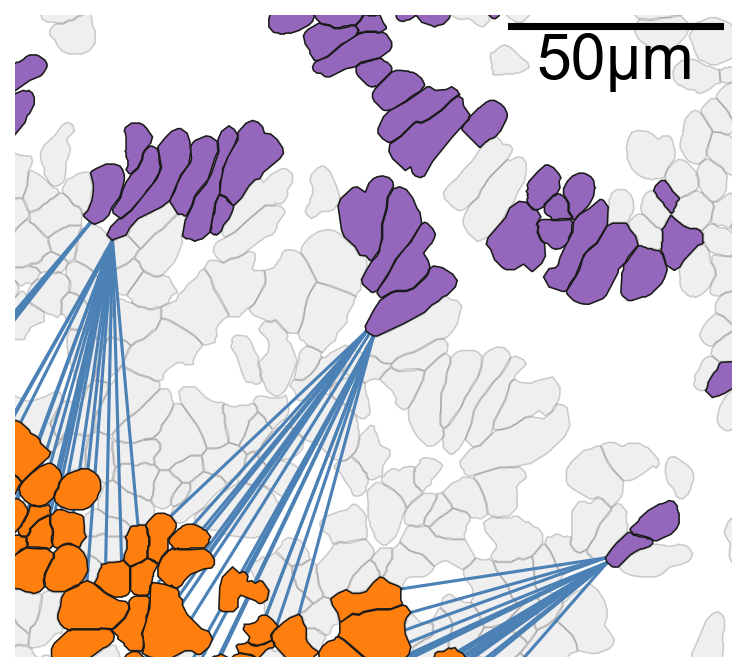

In [19]:
# Nearest Neighbour Plots Examples

# Set font properties for the plot
fontprops_small = fm.FontProperties(size=30)

# Create a new figure and axis for plotting
fig, ax = plt.subplots(figsize=(5.5, 5), nrows=1, ncols=1)

# Visualize the domain with cell boundaries
ms.visualise.visualise(
    domain_2,
    objects_to_plot=qCells,
    ax=ax,
    add_cbar=False,
    shape_kwargs={'alpha': 0.2, 'linewidth': 0.75, 'facecolor': [0.7, 0.7, 0.7, 1]}
)

# Plot the minimum distances between cells in Cluster 2 and Cluster 5
for i in range(len(minimising_a_2_5)):
    ax.plot(
        [minimising_a_2_5[i, 0], minimising_b_2_5[i, 0]],
        [minimising_a_2_5[i, 1], minimising_b_2_5[i, 1]],
        linewidth=1.5,
        color=[76/255, 129/255, 182/255],
        zorder=10
    )

# Visualize the domain with specific clusters highlighted
ms.visualise.visualise(
    domain_2,
    color_by=('label', 'Cluster ID'),
    objects_to_plot=ids_ex,
    show_boundary=False,
    marker_size=0,
    add_cbar=False,
    shape_kwargs={'alpha': 1, 'linewidth': 0.75},
    ax=ax,
    add_scalebar=True,
    scalebar_kwargs=dict(
        size=50,
        label='50µm',
        loc='upper right',
        pad=0.05,
        color='black',
        frameon=False,
        size_vertical=1,
        fontproperties=fontprops_small,
        zorder=100
    )
)

# Define the point of interest and radius for zooming in
point_of_interest = minimising_a_2_5[100, :]
radius = 75

# Set the limits of the plot to zoom in on the point of interest
ax.set_xlim([point_of_interest[0] - radius, point_of_interest[0] + radius])
ax.set_ylim([point_of_interest[1] - radius, point_of_interest[1] + radius])


(3923.400146484375, 4073.400146484375)

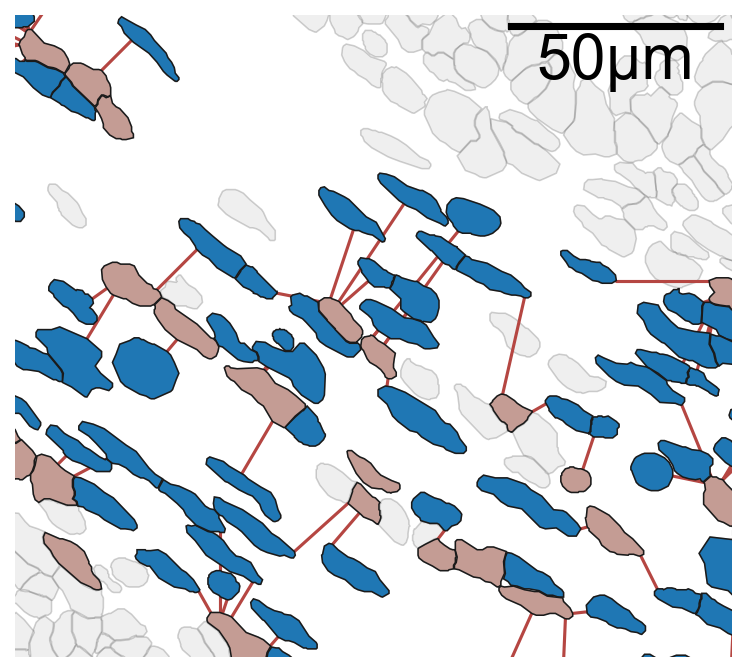

In [20]:
# Nearest Neighbour Plots Examples

# Set font properties for the plot
fontprops_small = fm.FontProperties(size=30)

# Create a new figure and axis for plotting
fig, ax = plt.subplots(figsize=(5.5, 5), nrows=1, ncols=1)

# Visualize the domain with cell boundaries
ms.visualise.visualise(
    domain_2,
    objects_to_plot=qCells,
    ax=ax,
    add_cbar=False,
    shape_kwargs={'alpha': 0.2, 'linewidth': 0.75, 'facecolor': [0.7, 0.7, 0.7, 1]}
)

# Plot the minimum distances between cells in Cluster 1 and Cluster 11
for i in range(len(minimising_a_1_11)):
    ax.plot(
        [minimising_a_1_11[i, 0], minimising_b_1_11[i, 0]],
        [minimising_a_1_11[i, 1], minimising_b_1_11[i, 1]],
        linewidth=1.5,
        color=[181/255, 70/255, 66/255, 1],
        zorder=10
    )

# Visualize the domain with specific clusters highlighted
ms.visualise.visualise(
    domain_2,
    color_by=('label', 'Cluster ID'),
    objects_to_plot=ids_in,
    show_boundary=False,
    marker_size=0,
    add_cbar=False,
    shape_kwargs={'alpha': 1, 'linewidth': 0.75},
    ax=ax,
    add_scalebar=True,
    scalebar_kwargs=dict(
        size=50,
        label='50µm',
        loc='upper right',
        pad=0.05,
        color='black',
        frameon=False,
        size_vertical=1,
        fontproperties=fontprops_small,
        zorder=100
    )
)

# Define the point of interest and radius for zooming in
point_of_interest = minimising_a_1_11[100, :]
radius = 75

# Set the limits of the plot to zoom in on the point of interest
ax.set_xlim([point_of_interest[0] - radius, point_of_interest[0] + radius])
ax.set_ylim([point_of_interest[1] - radius, point_of_interest[1] + radius])

Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


[[1365.73754883 3820.11254883]
 [2115.73754883 4495.11254883]]


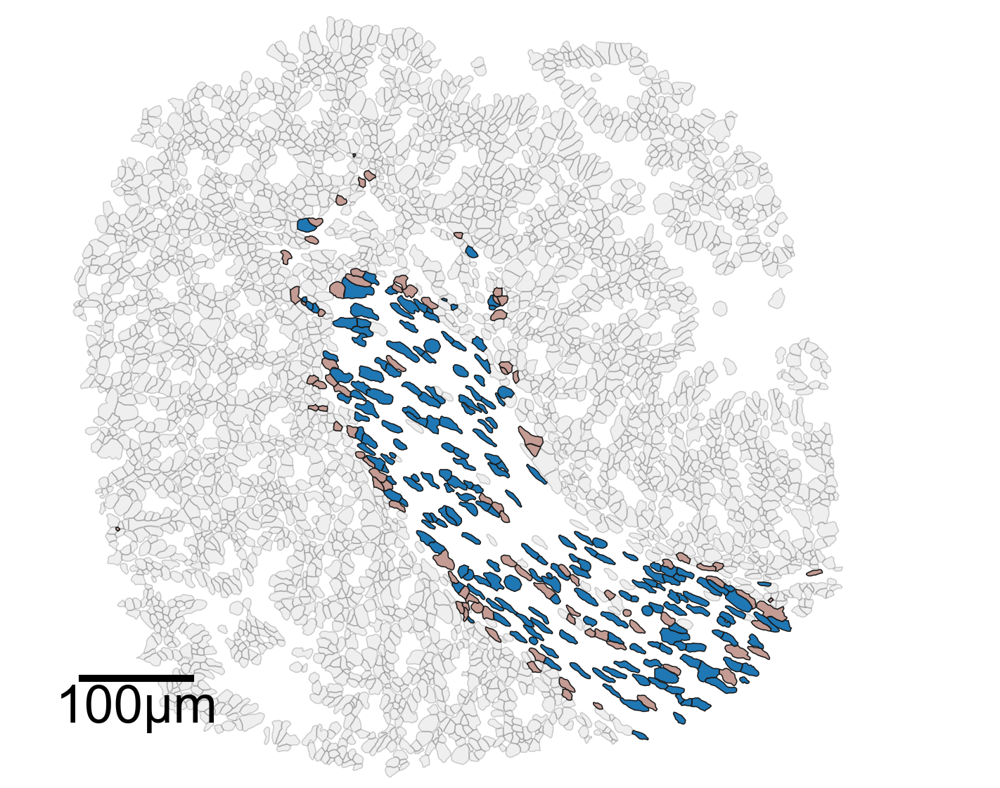

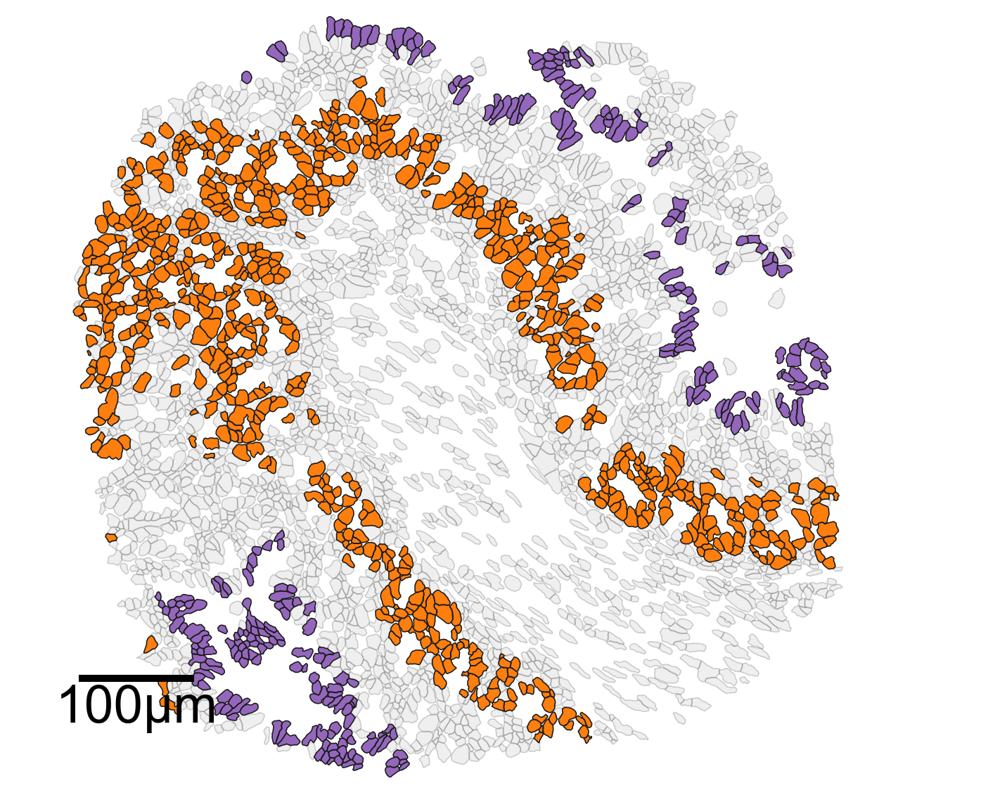

In [16]:
# In-depth analysis of the clusters of interest

# Set font properties for the plot
fontprops_small = fm.FontProperties(size=36)

# Create a new figure and axis for plotting
fig, ax = plt.subplots(figsize=(10, 8))

# Visualize the domain with cell boundaries
ms.visualise.visualise(
    domain_2,
    objects_to_plot=qCells,
    ax=ax,
    add_cbar=False,
    shape_kwargs={'alpha': 0.2, 'linewidth': 0.75, 'facecolor': [0.7, 0.7, 0.7, 1]}
)

# Highlight specific clusters (Cluster 1 and Cluster 11) in the domain
ms.visualise.visualise(
    domain_2,
    color_by=('label', 'Cluster ID'),
    objects_to_plot=ids_in,
    show_boundary=False,
    marker_size=0,
    add_cbar=False,
    shape_kwargs={'alpha': 1, 'linewidth': 0.75},
    ax=ax,
    add_scalebar=True,
    scalebar_kwargs=dict(
        size=100,
        label='100µm',
        loc='lower left',
        pad=0.75,
        color='black',
        frameon=False,
        size_vertical=5,
        fontproperties=fontprops_small,
        zorder=100
    )
)

# Set the limits of the plot to the bounding box of the domain
ax.set_xlim(domain_2.bounding_box[:, 0])
ax.set_ylim(domain_2.bounding_box[:, 1])

# Create another figure and axis for plotting
fig, ax = plt.subplots(figsize=(10, 8))

# Visualize the domain with cell boundaries
ms.visualise.visualise(
    domain_2,
    objects_to_plot=qCells,
    ax=ax,
    add_cbar=False,
    shape_kwargs={'alpha': 0.2, 'linewidth': 0.75, 'facecolor': [0.7, 0.7, 0.7, 1]}
)

# Highlight specific clusters (Cluster 2 and Cluster 5) in the domain
ms.visualise.visualise(
    domain_2,
    color_by=('label', 'Cluster ID'),
    objects_to_plot=ids_ex,
    show_boundary=False,
    marker_size=0,
    add_cbar=False,
    shape_kwargs={'alpha': 1, 'linewidth': 0.75},
    ax=ax,
    add_scalebar=True,
    scalebar_kwargs=dict(
        size=100,
        label='100µm',
        loc='lower left',
        pad=0.75,
        color='black',
        frameon=False,
        size_vertical=5,
        fontproperties=fontprops_small,
        zorder=100
    )
)

# Set the limits of the plot to the bounding box of the domain
ax.set_xlim(domain_2.bounding_box[:, 0])
ax.set_ylim(domain_2.bounding_box[:, 1])

# Print the bounding box of the domain
print(domain_2.bounding_box)


In [21]:
# Generate a proximity network for the domain
# This may take some time due to the complexity of the shapes involved

# Generate a network using the 'delaunay' method
# The network is distance-weighted with a minimum edge distance of 0 and a maximum edge distance of 1
G = ms.networks.generate_network(
    domain_2,
    network_name='proximity_boundary',
    objects_as_nodes=qCells,
    network_type='Proximity',
    min_edge_distance=0,
    max_edge_distance=1
)

In [22]:
# Convert cell boundaries to cell centers (centroids)
# This step converts the cell boundary objects into point objects representing the centroids of the cells.
domain_2.convert_objects(
    population=qCells,
    collection_name='Cell centres',
    object_type='point',
    conversion_method='centroids',
    remove_parent_objects=False
)

# Update the colors for the domain based on cluster IDs
# This step ensures that the colors assigned to each cluster ID are consistent across the figures.
new_colors = {j: cell_colors[cluster_id_order.index(j)] for j in domain_2.labels['Cluster ID']['categories']}
domain_2.update_colors(new_colors, colors_to_update='labels', label_name='Cluster ID')

In [23]:
# Query the domain to get cell centers
qPoints = ms.query.query(domain_2, ('Collection',), 'is', 'Cell centres')

# Create a query container to combine cell centers and cell boundaries
points_and_cells = ms.query.query_container()

# Add the queries for cell centers and cell boundaries to the container
points_and_cells.add_query(qPoints, 'OR', qCells)

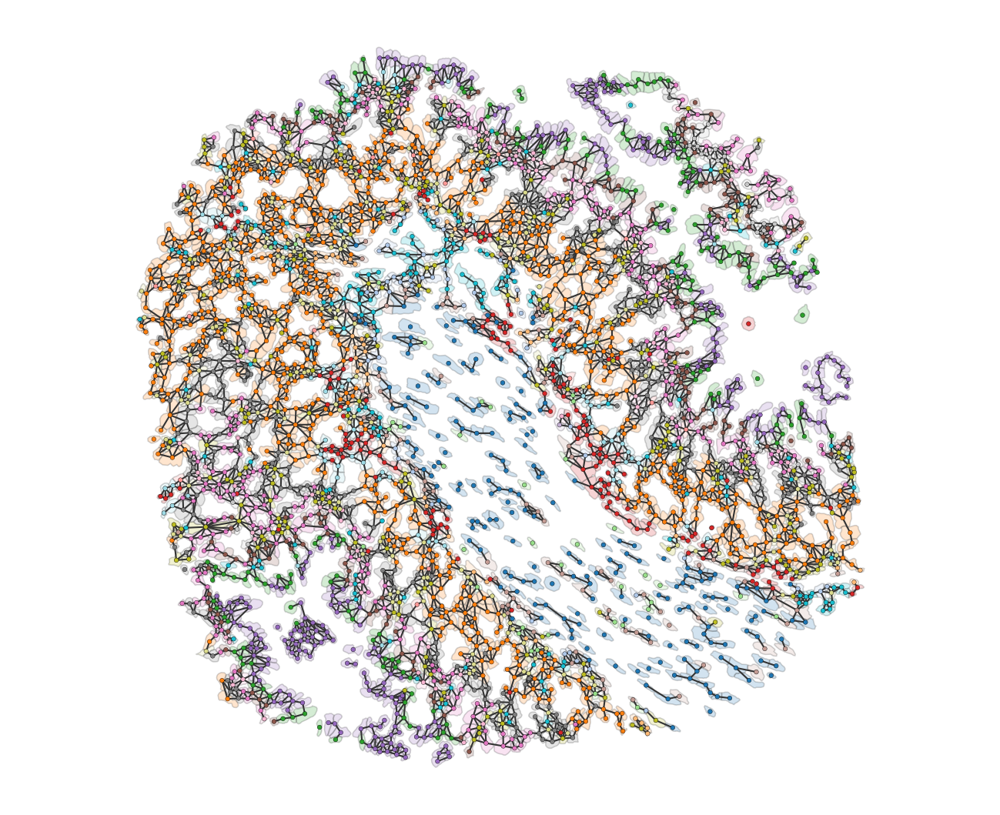

In [24]:
import networkx as nx

# Import necessary libraries
import matplotlib.pyplot as plt

# Create a new figure and axis for plotting
fig, ax = plt.subplots(figsize=(10, 8), nrows=1, ncols=1)

# Visualize the proximity network on the domain
# The network is visualized with edges colored in 'Greys' colormap
# The width of the edges is set to 1, and the edge color bar is not added
# The nodes are colored by their 'Cluster ID' labels
ms.visualise.visualise_network(
    domain_2,
    network_name='proximity_boundary',
    edge_weight_name=None,
    edge_cmap='Greys',
    edge_width=1,
    edge_vmin=0,
    edge_vmax=0.5,
    add_cbar=False,
    ax=ax,
    visualise_kwargs={
        'color_by': ('label', 'Cluster ID'),
        'objects_to_plot': points_and_cells,
        'add_cbar': False,
        'marker_size': 7.5,
        'shape_kwargs': {'alpha': 0.2, 'linewidth': 0.75},
        'scatter_kwargs': {'linewidth': 0.2, 'edgecolor': 'black'}
    }
)

# Remove x and y ticks and turn off the axis
ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')

# Show the plot
plt.show()


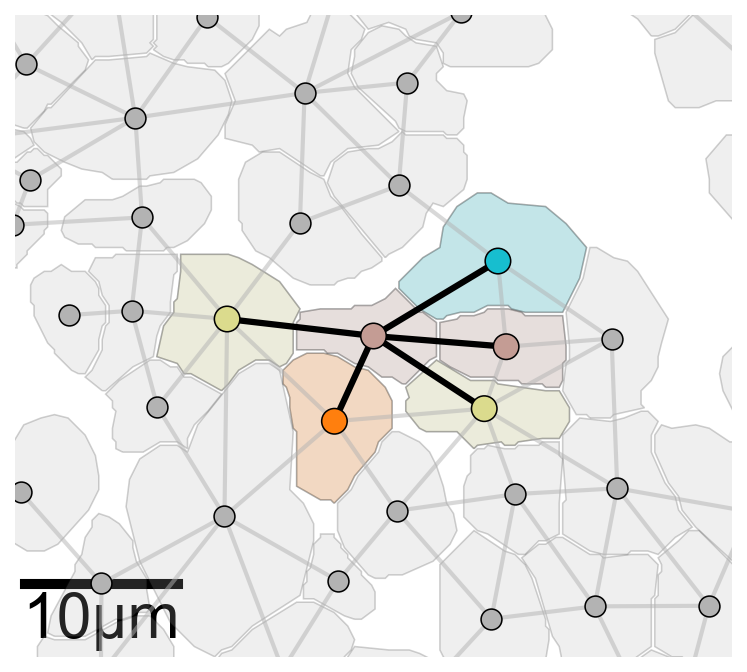

In [25]:
# Import necessary libraries
import networkx as nx
import matplotlib.pyplot as plt

# Generate k-hop neighbourhoods for the proximity network
khop_neighbourhoods_prox = ms.networks.khop_neighbourhood(domain_2, network_name='proximity_boundary', source_objects=None, k=1)

# Create a new figure and axis for plotting
fig, ax = plt.subplots(figsize=(5.5, 5), nrows=1, ncols=1)

# Define the index for the point of interest
index_me_plot = 2011

# Get all point IDs from the 'Cell centres' collection
all_point_ids = ms.query.return_object_IDs_from_query_like(domain_2, ('collection', 'Cell centres'))

# Initialize a list to store point IDs in the k-hop neighbourhood
qPoints_in_ME = []
for pid in all_point_ids:
    if domain_2.objects[pid].parents[0] in khop_neighbourhoods_prox[index_me_plot]:
        qPoints_in_ME.append(pid)

# Combine the point IDs and their k-hop neighbours
me_indices = np.append(qPoints_in_ME, khop_neighbourhoods_prox[index_me_plot])

# Get the positions of the objects
object_positions = {v: domain_2.objects[v].centroid for v in list(domain_2.objects.keys())}

# Visualize the cell boundaries
ms.visualise.visualise(
    domain_2,
    objects_to_plot=qCells,
    show_boundary=False,
    marker_size=100,
    add_cbar=False,
    ax=ax,
    shape_kwargs={'alpha': 0.2, 'linewidth': 0.75, 'facecolor': [0.7, 0.7, 0.7, 1]},
    scatter_kwargs={'linewidth': 0.75, 'edgecolor': 'black', 'c': [0.7, 0.7, 0.7, 1]}
)

# Visualize the cell centers
ms.visualise.visualise(
    domain_2,
    objects_to_plot=qPoints,
    show_boundary=False,
    marker_size=100,
    add_cbar=False,
    ax=ax,
    shape_kwargs={'alpha': 0.2, 'linewidth': 0.75, 'facecolor': [0.7, 0.7, 0.7, 1]},
    scatter_kwargs={'linewidth': 0.75, 'edgecolor': 'black', 'c': [0.7, 0.7, 0.7, 1]}
)

# Highlight the k-hop neighbourhood of the point of interest
ms.visualise.visualise(
    domain_2,
    color_by=('label', 'Cluster ID'),
    objects_to_plot=list(khop_neighbourhoods_prox[index_me_plot]),
    show_boundary=False,
    marker_size=100,
    add_cbar=False,
    ax=ax,
    shape_kwargs={'alpha': 0.2, 'linewidth': 0.75},
    scatter_kwargs={'linewidth': 0.75, 'edgecolor': 'black'}
)

# Highlight the points in the k-hop neighbourhood
ms.visualise.visualise(
    domain_2,
    color_by=('label', 'Cluster ID'),
    objects_to_plot=qPoints_in_ME,
    show_boundary=False,
    marker_size=150,
    add_cbar=False,
    ax=ax,
    shape_kwargs={'alpha': 0.2, 'linewidth': 0.75},
    scatter_kwargs={'linewidth': 0.75, 'edgecolor': 'black'},
    add_scalebar=True,
    scalebar_kwargs=dict(size=10, label='10µm', loc='lower left', pad=0., color='black', frameon=False, size_vertical=0.5, fontproperties=fontprops_small)
)

# Define the edges for the k-hop neighbourhood
edge_list_me = [(index_me_plot, v) for v in khop_neighbourhoods_prox[index_me_plot]]

# Draw the edges of the proximity network
collection_0 = nx.draw_networkx_edges(
    domain_2.networks['proximity_boundary'],
    object_positions,
    edge_color=[0.7, 0.7, 0.7, 0.5],
    width=2,
    ax=ax,
    arrows=False
)

# Draw the edges for the k-hop neighbourhood
collection = nx.draw_networkx_edges(
    domain_2.networks['proximity_boundary'],
    object_positions,
    edgelist=edge_list_me,
    edge_color=[0, 0, 0, 1],
    width=3,
    ax=ax,
    arrows=False
)
collection.set_zorder(20)
collection_0.set_zorder(19)

# Get the centroid of the point of interest
this_point = domain_2.objects[index_me_plot].centroid

# Set the axis limits to zoom in on the point of interest
ax.axis('off')
ax.set_ylim(this_point[1] - 20, this_point[1] + 20)
ax.set_xlim(this_point[0] - 20, this_point[0] + 20)
ax.set_aspect('equal')


In [26]:
# Define the clusters of interest
clusters_of_interest = ['Cluster 1', 'Cluster 2', 'Cluster 5', 'Cluster 11']

# Get the colors for the clusters of interest
these_cols = [cell_colors[cluster_id_order.index(v)] for v in clusters_of_interest]

# Get the labels and object indices for the domain
labels, object_indices = ms.query.get_labels(domain_2, 'Cluster ID')

# Initialize a dictionary to store the degree of each cluster
this_order_degree = {}

# Calculate the degree for each cluster
for id in label_categories:
    # Query the domain for the current cluster
    this_id_query = ms.query.query(domain_2, ('label', 'Cluster ID'), 'is', id)
    
    # Generate k-hop neighbourhoods for the current cluster
    khop_neighbourhoods_prox = ms.networks.khop_neighbourhood(domain_2, network_name='proximity_boundary', source_objects=this_id_query, k=1)
    
    # Initialize a list to store the degrees
    these_degrees = []
    
    # Calculate the degree for each k-hop neighbourhood
    for k in khop_neighbourhoods_prox:
        these_degrees.append(len(khop_neighbourhoods_prox[k]))
    
    # Store the degrees in the dictionary
    this_order_degree[id] = these_degrees

# Initialize an array to store the average contacts
avg_contacts = np.zeros((len(label_categories), len(clusters_of_interest) + 1))

# Calculate the average contacts for each cluster
for idex, id in enumerate(label_categories):
    # Query the domain for the current cluster
    this_id_query = ms.query.query(domain_2, ('label', 'Cluster ID'), 'is', id)
    
    # Generate k-hop neighbourhoods for the current cluster
    khop_neighbourhoods_prox = ms.networks.khop_neighbourhood(domain_2, network_name='proximity_boundary', source_objects=this_id_query, k=1)
    
    # Initialize an array to store the compositions
    these_compositions = np.zeros((len(khop_neighbourhoods_prox), len(clusters_of_interest) + 1))

    # Calculate the composition for each k-hop neighbourhood
    for kid, k in enumerate(khop_neighbourhoods_prox):
        this_neighbourhood = khop_neighbourhoods_prox[k]
        for n in this_neighbourhood:
            this_label_index = np.where(object_indices == n)[0][0]
            if labels[this_label_index] in clusters_of_interest:
                these_compositions[kid, clusters_of_interest.index(labels[this_label_index])] += 1
            else:
                these_compositions[kid, 4] += 1
        
        # Normalize the compositions
        these_compositions[kid, :] = these_compositions[kid, :] / np.sum(these_compositions[kid, :])
    
    # Calculate the average composition for the current cluster
    avg_contacts[idex, :] = np.mean(these_compositions, axis=0)

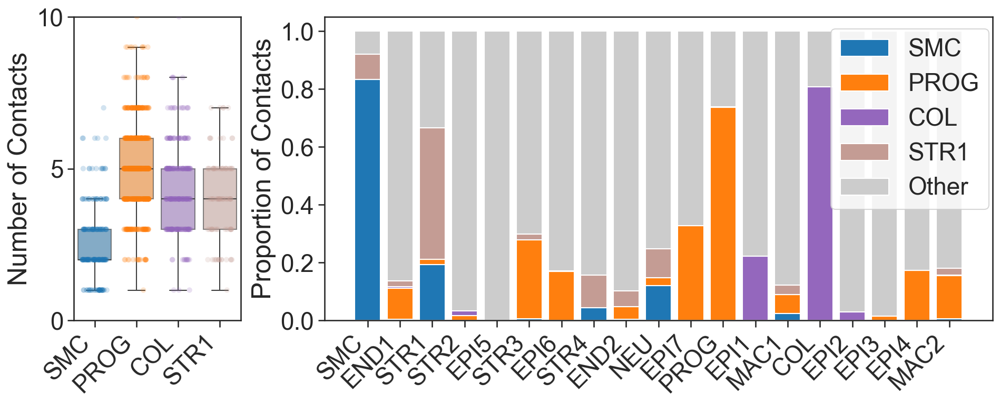

In [52]:
# Set the theme for seaborn plots
sns.set_theme(style='white', font_scale=2)
sns.set_style('ticks')

# Create a figure with two subplots
fig, ax = plt.subplots(figsize=(15, 5), nrows=1, ncols=2, gridspec_kw={'width_ratios': [1, 4]})

# Boxplot for the degree of each cluster
# The degree represents the number of contacts for each cell in the cluster
sns.boxplot(data=[this_order_degree[v] for v in clusters_of_interest], ax=ax[0], palette=these_cols, showfliers=False, saturation=0.75, boxprops={'alpha': 0.6}, orient='v')

# Strip plot to show individual data points on top of the boxplot
sns.stripplot(data=[this_order_degree[v] for v in clusters_of_interest], ax=ax[0], palette=these_cols, jitter=0.3, alpha=0.2, orient='v')

# Set x-axis labels for the boxplot
ax[0].set_xticklabels(clusters_of_interest, rotation=45, ha='right')

# Set y-axis label for the boxplot
ax[0].set_ylabel('Number of Contacts')

# Set y-axis limits and ticks for the boxplot
ax[0].set_ylim([0, 10])
ax[0].set_yticks([0, 5, 10])

# Set x-axis labels for the boxplot
ax[0].set_xticklabels([cell_id_to_type_dict[cluster] for cluster in clusters_of_interest], rotation=45, ha='right')
#ax[0].set_xlabel('Celltype ID')

# Stacked bar plot for the proportion of contacts for each cluster
# The stacked bar plot shows the proportion of contacts each cluster has with other clusters
clusters_of_interest_stacked = clusters_of_interest
these_cols.append([0.8, 0.8, 0.8, 1])  # Add color for 'Other' category

# Plot the stacked bar plot for each cluster
for i, cluster in enumerate(clusters_of_interest_stacked):
    ax[1].bar(numeric_label_categories, avg_contacts[:, i], label=cell_id_to_type_dict[cluster], bottom=np.sum(avg_contacts[:, :i], axis=1), color=these_cols[i])

# Plot the 'Other' category in the stacked bar plot
ax[1].bar(numeric_label_categories, avg_contacts[:, -1], label='Other', bottom=np.sum(avg_contacts[:, :-1], axis=1), color=these_cols[-1])

# Set x-axis and y-axis labels for the stacked bar plot
#ax[1].set_xlabel('Celltype ID')
ax[1].set_ylabel('Proportion of Contacts')

# Set x-axis labels for the stacked bar plot
ax[1].set_xticklabels(numeric_label_categories, rotation=45, ha='right')

# Add legend to the stacked bar plot
ax[1].legend(bbox_to_anchor=(0.74, 1), loc='upper left')

# Show the plot
plt.show()


In [25]:
# Summary statistics for the clusters of interest
# Loop through each cluster of interest
for v in clusters_of_interest:
    # Calculate and print the mean degree for the current cluster
    print('Mean degree for', v, '=', np.mean(this_order_degree[v]))

Mean degree for Cluster 1 = 2.58128078817734
Mean degree for Cluster 2 = 5.048076923076923
Mean degree for Cluster 5 = 4.340823970037453
Mean degree for Cluster 11 = 4.076923076923077
